# Дорожные знаки

**Цель:** разработать MVP системы понимания дорожных знаков. Система должна детектировать знак и определять его категорю:

1. запрещающие
2. предупреждающие
3. знаки приоритета
4. предписывающие
5. особые предписания
6. информационные
7. сервисные
8. с дополнительной информацией

Для обучения был выбран датасет с платформы Kaggle (https://www.kaggle.com/datasets/watchman/rtsd-dataset). В данном датасете имеются размеченные дорожные знаки с российских дорог общего пользования. 

**Задачи для выполнения данного проекта:**

1. Сократить количество категорий до 8;
2. Обучить модель YOLO, выбрать оптимальную конфигурацию;
3. Решить проблему дисбаланса классов, если она имеется;
4. Обучить модель с учетом решения пункта 3;
5. Получить готовую обученную модель;
6. Проверить работу модели на тестовых данных;
7. Оформить работу (репозиторий Github, презентация)

## Импорты

In [1]:
import json
import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import pandas as pd
from pathlib import Path
import random
from collections import defaultdict

## Загрузка данных

In [2]:
# Пути к файлам
DATA_DIR = Path("archive")
IMAGES_DIR = DATA_DIR / "rtsd-frames/rtsd-frames"
LABEL_MAP = DATA_DIR / "label_map.json"
TRAIN_ANNO = DATA_DIR / "train_anno.json"
VAL_ANNO = DATA_DIR / "val_anno.json"
OUTPUT_DIR = Path("For_presentation")
OUTPUT_DIR.mkdir(exist_ok=True)

In [3]:
# Загрузка аннотаций
with open(TRAIN_ANNO, 'r') as f:
    train_anno = json.load(f)
with open(VAL_ANNO, 'r') as f:
    val_anno = json.load(f)
with open(LABEL_MAP, 'r') as f:
    label_map = json.load(f)

# Объединяем train и val для EDA
all_annotations = train_anno['annotations'] + val_anno['annotations']
all_images = train_anno['images'] + val_anno['images']

In [4]:
# Сколько всего изображений
print(f"Всего изображений: {len(all_images)}")

# Сколько уникальных классов
class_ids = set([ann['category_id'] for ann in all_annotations])
print(f"Уникальных классов: {len(class_ids)}")

Всего изображений: 59188
Уникальных классов: 155


In [5]:
print("Тип label_map:", type(label_map)) 
print("Пример содержимого:", list(label_map.items())[:3])  # Первые 3 элемента

Тип label_map: <class 'dict'>
Пример содержимого: [('2_1', 1), ('1_23', 2), ('1_17', 3)]


In [6]:
print("Ключи label_map:", label_map.keys())  # Ключи

Ключи label_map: dict_keys(['2_1', '1_23', '1_17', '3_24', '8_2_1', '5_20', '5_19_1', '5_16', '3_25', '6_16', '7_15', '2_2', '2_4', '8_13_1', '4_2_1', '1_20_3', '1_25', '3_4', '8_3_2', '3_4_1', '4_1_6', '4_2_3', '4_1_1', '1_33', '5_15_5', '3_27', '1_15', '4_1_2_1', '6_3_1', '8_1_1', '6_7', '5_15_3', '7_3', '1_19', '6_4', '8_1_4', '8_8', '1_16', '1_11_1', '6_6', '5_15_1', '7_2', '5_15_2', '7_12', '3_18', '5_6', '5_5', '7_4', '4_1_2', '8_2_2', '7_11', '1_22', '1_27', '2_3_2', '5_15_2_2', '1_8', '3_13', '2_3', '8_3_3', '2_3_3', '7_7', '1_11', '8_13', '1_12_2', '1_20', '1_12', '3_32', '2_5', '3_1', '4_8_2', '3_20', '3_2', '2_3_6', '5_22', '5_18', '2_3_5', '7_5', '8_4_1', '3_14', '1_2', '1_20_2', '4_1_4', '7_6', '8_1_3', '8_3_1', '4_3', '4_1_5', '8_2_3', '8_2_4', '1_31', '3_10', '4_2_2', '7_1', '3_28', '4_1_3', '5_4', '5_3', '6_8_2', '3_31', '6_2', '1_21', '3_21', '1_13', '1_14', '2_3_4', '4_8_3', '6_15_2', '2_6', '3_18_2', '4_1_2_2', '1_7', '3_19', '1_18', '2_7', '8_5_4', '5_15_7', '5_14',

In [7]:
# Создаем обратный словарь: {числовой_id: "X_Y"}
reverse_label_map = {v: k for k, v in label_map.items()}
# Пример:
print(reverse_label_map[1])  # Выведет "2_1"
print(reverse_label_map[2])  # Выведет "1_23"

2_1
1_23


In [8]:
code_to_name = {
    "2_1": "Главная дорога",
    "1_23": "Опасный поворот",
    "1_17": "Искусственная неровность",
    "3_24": "Ограничение максимальной скорости",
    "8_2_1": "Зона действия",
    "5_20": "Искусственная неровность",
    "5_19_1": "Пешеходный переход",
    "5_16": "Место остановки автобуса",
    "3_25": "Конец зоны ограничения максимальной скорости",
    "6_16": "Стоп-линия",
    "7_15": "Место стоянки такси",
    "2_2": "Конец главной дороги",
    "2_4": "Уступите дорогу",
    "8_13_1": "Направление главной дороги",
    "4_2_1": "Объезд препятствия справа",
    "1_20_3": "Сужение дороги с обеих сторон",
    "1_25": "Дорожные работы",
    "3_4": "Движение грузовых автомобилей запрещено",
    "8_3_2": "Направление действия",
    "3_4_1": "Вид транспортного средства",
    "4_1_6": "Движение направо или налево",
    "4_2_3": "Объезд препятствия слева или справа",
    "4_1_1": "Движение прямо",
    "1_33": "Прочие опасности",
    "5_15_5": "Конец полосы",
    "3_27": "Остановка запрещена",
    "1_15": "Скользкая дорога",
    "4_1_2_1": "Направления движения на следующем перекрестке",
    "6_3_1": "Место для разворота",
    "8_1_1": "Расстояние до объекта",
    "6_7": "Подземный пешеходный переход",
    "5_15_3": "Начало полосы",
    "7_3": "Автозаправочная станция",
    "1_19": "Опасная обочина",
    "6_4": "Парковка",
    "8_1_4": "Расстояние до объекта",
    "8_8": "Платные услуги",
    "1_16": "Неровная дорога",
    "1_11_1": "Опасный поворот первый направо",
    "6_6": "Надземный пешеходный переход",
    "5_15_1": "Направления движения по полосам",
    "7_2": "Больница",
    "5_15_2": "Направления движения по полосе",
    "7_12": "Пост дорожно-патрульной службы",
    "3_18": "Поворот направо запрещен",
    "5_6": "Конец дороги с односторонним движением",
    "5_5": "Дорога с односторонним движением",
    "7_4": "Техническое обслуживание автомобилей",
    "4_1_2": "Движение направо",
    "8_2_2": "Зона действия",
    "7_11": "Пункт питания",
    "1_22": "Пешеходный переход",
    "1_27": "Выброс гравия",
    "2_3_2": "Примыкание второстепенной дороги",
    "5_15_2_2": "Направления движения по полосе",
    "1_8": "Светофорное регулирование",
    "3_13": "Ограничение высоты",
    "2_3": "Пересечение с второстепенной дорогой",
    "8_3_3": "Направление действия",
    "2_3_3": "Примыкание второстепенной дороги",
    "7_7": "Пункт контроля международных автомобильных перевозок",
    "1_11": "Опасный поворот",
    "8_13": "Направление главной дороги",
    "1_12_2": "Опасные повороты первый налево",
    "1_20": "Сужение дороги",
    "1_12": "Опасные повороты",
    "3_32": "Движение транспортных средств с опасными грузами запрещено",
    "2_5": "Движение без остановки запрещено",
    "3_1": "Въезд запрещен",
    "4_8_2": "Направление движения транспортных средств с опасными грузами",
    "3_20": "Обгон запрещен",
    "3_2": "Движение механических транспортных средств запрещено",
    "2_3_6": "Примыкание второстепенной дороги",
    "5_22": "Конец населенного пункта",
    "5_18": "Направление движения к населенному пункту",
    "2_3_5": "Примыкание второстепенной дороги",
    "7_5": "Мойка автомобилей",
    "8_4_1": "Вид транспортного средства",
    "3_14": "Ограничение ширины",
    "1_2": "Железнодорожный переезд без шлагбаума",
    "1_20_2": "Сужение дороги слева",
    "4_1_4": "Движение прямо или направо",
    "7_6": "Телефон",
    "8_1_3": "Расстояние до объекта",
    "8_3_1": "Направление действия",
    "4_3": "Круговое движение",
    "4_1_5": "Движение прямо или налево",
    "8_2_3": "Зона действия",
    "8_2_4": "Зона действия",
    "1_31": "Тоннель",
    "3_10": "Движение пешеходов запрещено",
    "4_2_2": "Объезд препятствия слева",
    "7_1": "Пункт медицинской помощи",
    "3_28": "Стоянка запрещена",
    "4_1_3": "Движение налево",
    "5_4": "Конец дороги с полосой для маршрутных транспортных средств",
    "5_3": "Дорога для автомобилей",
    "6_8_2": "Тупик",
    "3_31": "Конец зоны всех ограничений",
    "6_2": "Рекомендуемая скорость",
    "1_21": "Двустороннее движение",
    "3_21": "Конец зоны запрещения обгона",
    "1_13": "Крутой спуск",
    "1_14": "Крутой подъем",
    "2_3_4": "Примыкание второстепенной дороги",
    "4_8_3": "Направление движения транспортных средств с опасными грузами",
    "6_15_2": "Направление движения для грузовых автомобилей",
    "2_6": "Преимущество встречного движения",
    "3_18_2": "Поворот налево запрещен",
    "4_1_2_2": "Направления движения на следующем перекрестке",
    "1_7": "Пересечение с круговым движением",
    "3_19": "Разворот запрещен",
    "1_18": "Выброс гравия",
    "2_7": "Преимущество перед встречным движением",
    "8_5_4": "Время действия",
    "5_15_7": "Направление движения по полосам",
    "5_14": "Полоса для маршрутных транспортных средств",
    "5_21": "Жилая зона",
    "1_1": "Железнодорожный переезд со шлагбаумом",
    "6_15_1": "Направление движения для грузовых автомобилей",
    "8_6_4": "Способ постановки транспортного средства на стоянку",
    "8_15": "Слепые пешеходы",
    "4_5": "Пешеходная дорожка",
    "3_11": "Ограничение массы",
    "8_18": "Инвалиды",
    "8_4_4": "Вид транспортного средства",
    "3_30": "Стоянка запрещена по четным числам месяца",
    "5_7_1": "Выезд на дорогу с полосой для маршрутных транспортных средств",
    "5_7_2": "Выезд на дорогу с полосой для маршрутных транспортных средств",
    "1_5": "Пересечение с трамвайной линией",
    "3_29": "Стоянка запрещена по нечетным числам месяца",
    "6_15_3": "Направление движения для грузовых автомобилей",
    "5_12": "Конец дороги с полосой для велосипедистов",
    "3_16": "Ограничение минимальной дистанции",
    "1_30": "Низколетящие самолеты",
    "5_11": "Дорога с полосой для велосипедистов",
    "1_6": "Пересечение равнозначных дорог",
    "8_6_2": "Способ постановки транспортного средства на стоянку",
    "6_8_3": "Тупик",
    "3_12": "Ограничение массы, приходящейся на ось транспортного средства",
    "3_33": "Движение транспортных средств с опасными грузами запрещено",
    "8_4_3": "Вид транспортного средства",
    "5_8": "Реверсивное движение",
    "8_14": "Полоса движения",
    "8_17": "Таможня",
    "3_6": "Движение тракторов запрещено",
    "1_26": "Перегон скота",
    "8_5_2": "Время действия",
    "6_8_1": "Тупик",
    "5_17": "Велосипедная дорожка",
    "1_10": "Выезд на набережную",
    "8_16": "Влажное покрытие",
    "7_18": "Общественный телефон",
    "7_14": "Пункт контроля транспортных средств",
    "8_23": "Фотовидеофиксация"
}

**Предупреждающие знаки**

- "1_23": "Опасный поворот", 
- "1_17": "Искусственная неровность", 
- "1_20_3": "Сужение дороги с обеих сторон",
- "1_25": "Дорожные работы",
- "1_33": "Прочие опасности",
- "1_15": "Скользкая дорога",
- "1_19": "Опасная обочина",
- "1_16": "Неровная дорога",
- "1_11_1": "Опасный поворот первый направо",
- "1_22": "Пешеходный переход",
- "1_27": "Выброс гравия", 1_18
- "1_8": "Светофорное регулирование",
- "1_11": "Опасный поворот",
- "1_12_2": "Опасные повороты первый налево",
- "1_20": "Сужение дороги",
- "1_12": "Опасные повороты",
- "1_2": "Железнодорожный переезд без шлагбаума",
- "1_20_2": "Сужение дороги слева",
- "1_31": "Тоннель",
- "1_21": "Двустороннее движение",
- "1_13": "Крутой спуск",
- "1_14": "Крутой подъем",
- "1_7": "Пересечение с круговым движением",
- "1_18": "Выброс гравия",
- "1_1": "Железнодорожный переезд со шлагбаумом",
- "1_5": "Пересечение с трамвайной линией",
- "1_30": "Низколетящие самолеты",
- "1_6": "Пересечение равнозначных дорог",
- "1_26": "Перегон скота",
- "1_10": "Выезд на набережную"


**Знаки приоритета**

- "2_1": "Главная дорога", 
- "2_2": "Конец главной дороги",
- "2_4": "Уступите дорогу",
- "2_3_2": "Примыкание второстепенной дороги",
- "2_3": "Пересечение с второстепенной дорогой",
- "2_3_3": "Примыкание второстепенной дороги",
- "2_5": "Движение без остановки запрещено",
- "2_3_6": "Примыкание второстепенной дороги",
- "2_3_5": "Примыкание второстепенной дороги",
- "2_3_4": "Примыкание второстепенной дороги",
- "2_6": "Преимущество встречного движения",
- "2_7": "Преимущество перед встречным движением"
    

**Запрещающие знаки**

- "3_24": "Ограничение максимальной скорости", 
- "3_25": "Конец зоны ограничения максимальной скорости",
- "3_4": "Движение грузовых автомобилей запрещено",
- **"3_4_1": "Вид транспортного средства" = 8_4_1 Знаки дополнительной информации**
- "3_27": "Остановка запрещена",
- "3_18": "Поворот направо запрещен",
- "3_13": "Ограничение высоты",
- "3_32": "Движение транспортных средств с опасными грузами запрещено",
- "3_1": "Въезд запрещен",
- "3_20": "Обгон запрещен",
- "3_2": "Движение механических транспортных средств запрещено", 3_3
- "3_14": "Ограничение ширины",
- "3_10": "Движение пешеходов запрещено",
- "3_28": "Стоянка запрещена",
- "3_31": "Конец зоны всех ограничений",
- "3_21": "Конец зоны запрещения обгона",
- "3_18_2": "Поворот налево запрещен",
- "3_19": "Разворот запрещен",
- "3_11": "Ограничение массы",
- "3_30": "Стоянка запрещена по четным числам месяца",
- "3_29": "Стоянка запрещена по нечетным числам месяца",
- "3_16": "Ограничение минимальной дистанции",
- "3_12": "Ограничение массы, приходящейся на ось транспортного средства",
- "3_33": "Движение транспортных средств с опасными грузами запрещено",
- "3_6": "Движение тракторов запрещено"


**Предписывающие знаки**

- "4_2_1": "Объезд препятствия справа", 
- "4_1_6": "Движение направо или налево",
- "4_2_3": "Объезд препятствия слева или справа",
- "4_1_1": "Движение прямо",
- **"4_1_2_1": "Направления движения на следующем перекрестке" = 5.36д?**
- "4_1_2": "Движение направо",
- "4_8_2": "Направление движения транспортных средств с опасными грузами",
- "4_1_4": "Движение прямо или направо",
- "4_3": "Круговое движение",
- "4_1_5": "Движение прямо или налево",
- "4_2_2": "Объезд препятствия слева",
- "4_1_3": "Движение налево",
- "4_8_3": "Направление движения транспортных средств с опасными грузами",
- **"4_1_2_2": "Направления движения на следующем перекрестке"= 5.36д?**,
- "4_5": "Пешеходная дорожка"



**Знаки особых предписаний**

- "5_20": "Искусственная неровность", 
- "5_19_1": "Пешеходный переход",
- "5_16": "Место остановки автобуса",
- "5_15_5": "Конец полосы",
- "5_15_3": "Начало полосы",
- "5_15_1": "Направления движения по полосам",
- "5_15_2": "Направления движения по полосе",
- "5_6": "Конец дороги с односторонним движением",
- "5_5": "Дорога с односторонним движением",
- "5_15_2_2": "Направления движения по полосе",
- "5_22": "Конец населенного пункта", 5_24_1, 5_24_2
- "5_18": "Направление движения к населенному пункту",**?**
- "5_4": "Конец дороги с полосой для маршрутных транспортных средств", 5_12_1
- "5_3": "Дорога для автомобилей",
- "5_15_7": "Направление движения по полосам",
- "5_14": "Полоса для маршрутных транспортных средств",
- "5_21": "Жилая зона",
- "5_7_1": "Выезд на дорогу с полосой для маршрутных транспортных средств", 5_13_1
- "5_7_2": "Выезд на дорогу с полосой для маршрутных транспортных средств", 5_13_2
- "5_12": "Конец дороги с полосой для велосипедистов",
- "5_11": "Дорога с полосой для велосипедистов",
- "5_8": "Реверсивное движение",
- "5_17": "Велосипедная дорожка" **?**


**Информационные знаки**

- "6_16": "Стоп-линия", 
- "6_3_1": "Место для разворота",
- "6_7": "Подземный пешеходный переход",
- "6_4": "Парковка",
- "6_6": "Надземный пешеходный переход",
- "6_8_2": "Тупик",
- "6_2": "Рекомендуемая скорость",
- "6_15_2": "Направление движения для грузовых автомобилей",
- "6_15_1": "Направление движения для грузовых автомобилей",
- "6_15_3": "Направление движения для грузовых автомобилей",
- "6_8_3": "Тупик",
- "6_8_1": "Тупик"


**Знаки сервиса**
- **"7_15": "Место стоянки такси" = 5_18 Знаки особых предписаний**
- "7_3": "Автозаправочная станция", 
- "7_2": "Больница",
- "7_12": "Пост дорожно-патрульной службы",
- "7_4": "Техническое обслуживание автомобилей",
- "7_11": "Пункт питания",
- "7_7": "Пункт контроля международных автомобильных перевозок" ?
- "7_5": "Мойка автомобилей",
- "7_6": "Телефон",
- "7_1": "Пункт медицинской помощи",
- "7_18": "Общественный телефон", 7_6
- "7_14": "Пункт контроля транспортных средств"


**Знаки дополнительной информации**

- "8_2_1": "Зона действия", 
- "8_13_1": "Направление главной дороги",
- "8_3_2": "Направление действия",
- "8_1_1": "Расстояние до объекта",
- "8_1_4": "Расстояние до объекта",
- "8_8": "Платные услуги", 
- "8_2_2": "Зона действия",
- "8_3_3": "Направление действия",
- "8_13": "Направление главной дороги",
- "8_4_1": "Вид транспортного средства",
- "8_1_3": "Расстояние до объекта",
- "8_3_1": "Направление действия",
- "8_2_3": "Зона действия",
- "8_2_4": "Зона действия",
- "8_5_4": "Время действия",
- "8_6_4": "Способ постановки транспортного средства на стоянку",
- "8_15": "Слепые пешеходы",
- "8_18": "Инвалиды", 8_17
- "8_4_4": "Вид транспортного средства",
- "8_6_2": "Способ постановки транспортного средства на стоянку",
- "8_4_3": "Вид транспортного средства",
- "8_14": "Полоса движения",
- "8_17": "Таможня" ?, 
- "8_5_2": "Время действия",
- "8_16": "Влажное покрытие",
- "8_23": "Фотовидеофиксация"


В разметке знаков есть некоторые ошибки, не все метки соответствуют своим группам знаков. Пока не будем это исправлять, посмотрим что получится после обучения модели.

In [ ]:
def plot_images_with_annotations(
    images_list,
    annotations,
    label_map=None,
    code_to_name=None,
    use_category_name: bool = False,
    save: bool = True,
    output_dir: Path = Path("For_presentation")
):
    
    '''
    Функция строит график с боксами и метками и сохраняет на диск
    
    Флаг use_category_name=True/False:
    - Если use_category_name=True → используем "category_name" напрямую из аннотаций.
    - Если False → извлекаем название знака по category_id через label_map + code_to_name
    
    '''
    output_dir.mkdir(parents=True, exist_ok=True)
    
    # Только если нужно извлекать из category_id
    reverse_label_map = {v: k for k, v in label_map.items()} if label_map else {}

    for sample in images_list:
        img_path = IMAGES_DIR / Path(sample["file_name"]).name
        try:
            img = Image.open(img_path).convert("RGB")
            width_px, height_px = img.size
            dpi = 100
            figsize = (width_px / dpi, height_px / dpi)
        except FileNotFoundError:
            print(f"Файл не найден: {img_path}")
            continue

        fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
        ax.imshow(img)

        img_annos = [a for a in annotations if a["image_id"] == sample["id"]]
        label_names = []

        for ann in img_annos:
            x, y, w, h = ann["bbox"]

            if use_category_name:
                label_name = ann.get("category_name", "Unknown")
            else:
                category_id = ann["category_id"]
                label_code = reverse_label_map.get(category_id, "Unknown")
                label_name = code_to_name.get(label_code, label_code)

            label_names.append(label_name)

            ax.add_patch(patches.Rectangle((x, y), w, h, fill=False,
                                           edgecolor="lime", linewidth=1.5))
            text_y = y - 8 if y > 20 else y + h + 12
            ax.text(x + 5, text_y, label_name,
                    fontsize=8, color="white", bbox=dict(facecolor="green", alpha=0.7))

        ax.axis("off")
        plt.tight_layout()

        if save:
            stem = Path(sample["file_name"]).stem
            unique_labels = list(dict.fromkeys(label_names))
            if len(unique_labels) == 1:
                label_part = unique_labels[0].replace(" ", "_")
            else:
                label_part = "_".join(label.replace(" ", "_") for label in unique_labels[:2])
            save_name = f"{stem}_{label_part}.jpg"
            save_path = output_dir / save_name
            plt.savefig(save_path, bbox_inches='tight', pad_inches=0)
            print(f"Сохранено: {save_path}")
        
        plt.show()
        plt.close()

Сохранено: For_presentation\autosave09_10_2012_14_08_06_2_Ограничение_максимальной_скорости_Сужение_дороги.jpg


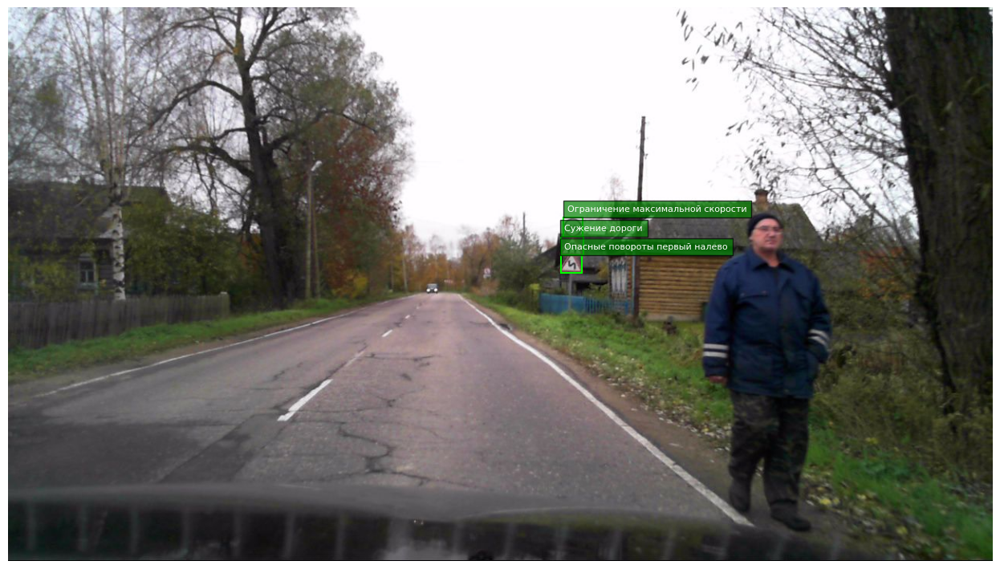

Сохранено: For_presentation\autosave09_10_2012_11_20_09_0_Место_остановки_автобуса.jpg


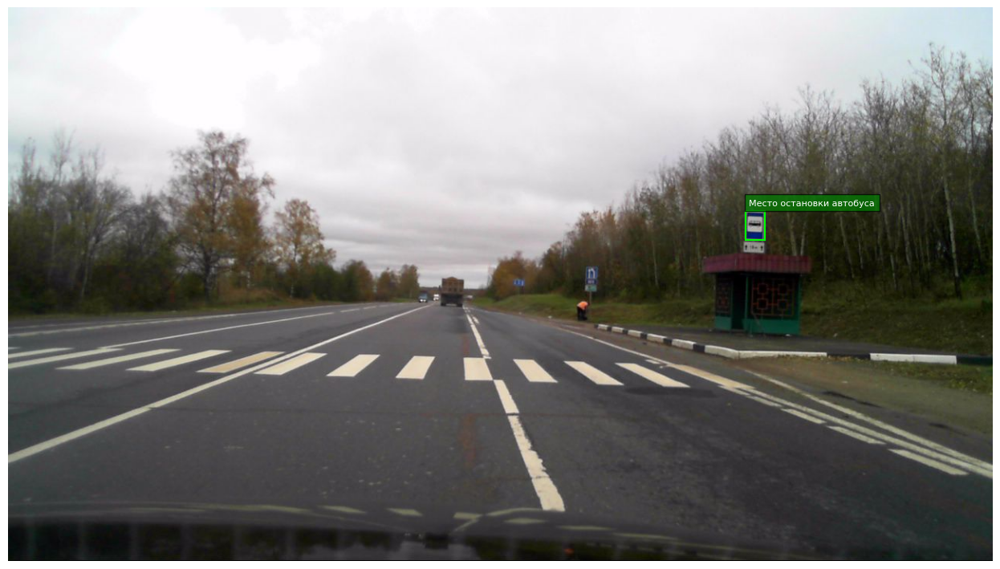

Сохранено: For_presentation\autosave23_10_2012_10_01_00_0_Движение_прямо_Начало_полосы.jpg


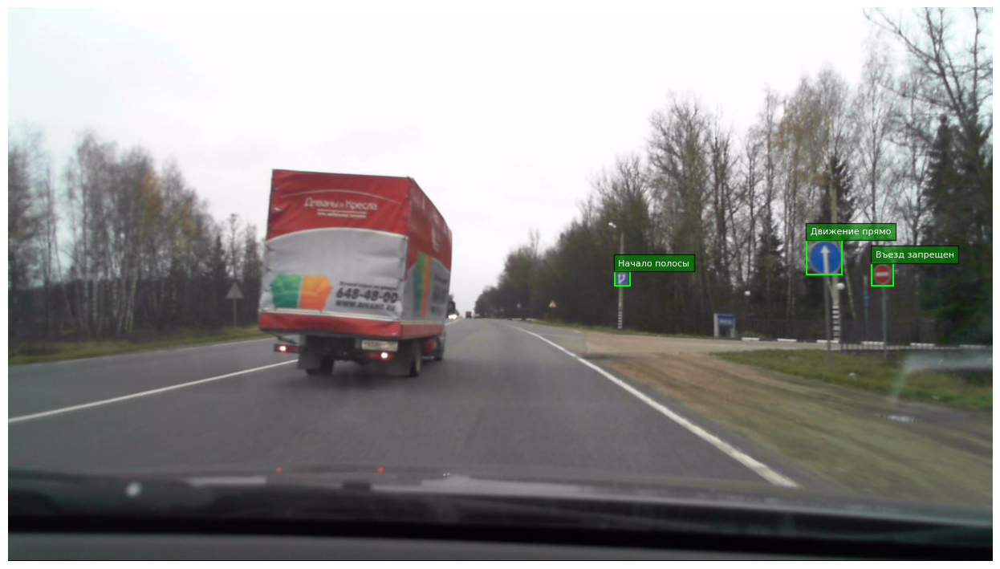

Сохранено: For_presentation\autosave16_04_2013_13_19_29_2_Примыкание_второстепенной_дороги.jpg


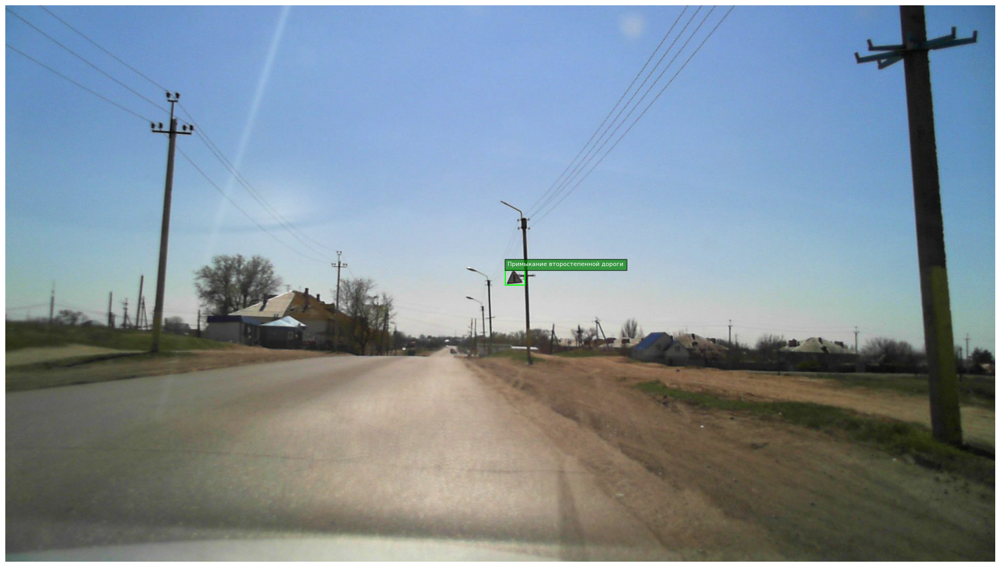

Сохранено: For_presentation\autosave10_10_2012_14_48_35_0_Пешеходный_переход_Уступите_дорогу.jpg


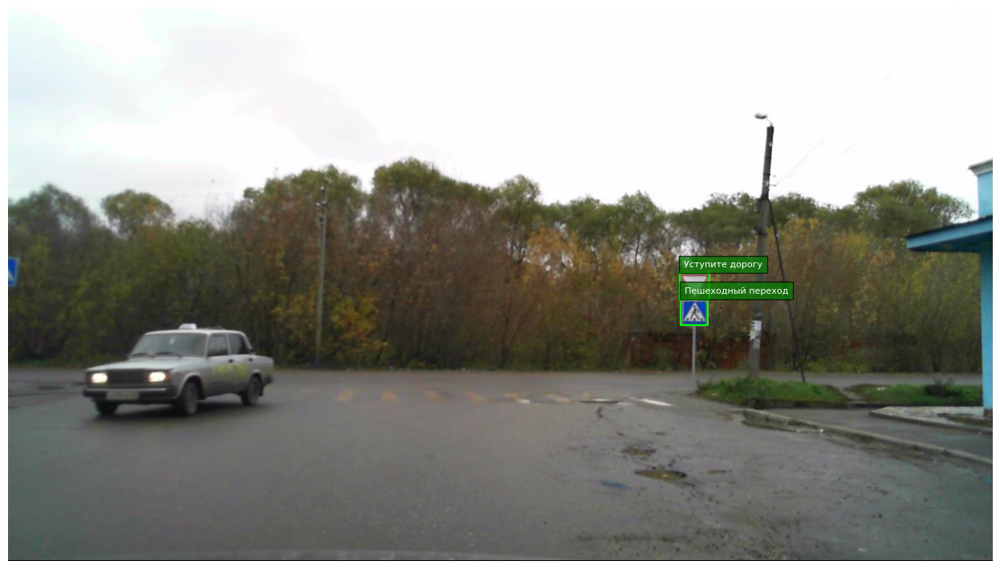

In [10]:
random.seed(18)
sample_images = random.sample(all_images, 5)

plot_images_with_annotations(
    images_list=sample_images,
    annotations=all_annotations,
    label_map=label_map,
    code_to_name=code_to_name,
    use_category_name=False,
    save=True,
    output_dir=OUTPUT_DIR
)

## Создание 8 категорий

Согласно *label_map* у знаков имеются названия `2_1`, `1_23` и т.д., где первая цифра характеризует, к какой категории знаков он относится. Так например `знак 2.1 - Главная дорога` обозначается как `2_1`. Используя этот принцип, сгруппируем имеющиеся категории по 8 категориям:

1. `1`_Х_Х - запрещающие
2. `2`_Х_Х - предупреждающие
3. `3`_Х_Х - знаки приоритета
4. `4`_Х_Х - предписывающие
5. `5`_Х_Х - особые предписания
6. `6`_Х_Х - информационные
7. `7`_Х_Х - сервисные
8. `8`_Х_Х - с дополнительной информацией

In [11]:
# Соответствие префиксов и категорий
prefix_to_category = {
    "1": "Предупреждающие",
    "2": "Знаки приоритета",
    "3": "Запрещающие",
    "4": "Предписывающие",
    "5": "Особые предписания",
    "6": "Информационные",
    "7": "Сервисные",
    "8": "С доп. информацией"
}

# Функция для определения категории по числовому class_id
def get_category(class_id):
    # Получаем строковый ключ (например, "2_1")
    key = reverse_label_map.get(class_id, "")
    if not key:
        return "Неизвестно"
    # Извлекаем префикс (первую часть ключа)
    prefix = key.split("_")[0]
    return prefix_to_category.get(prefix, "Неизвестно")

# Пример:
print(get_category(1)) 
print(get_category(2)) 

Знаки приоритета
Предупреждающие


In [12]:
# Добавляем категории к аннотациям train
for ann in train_anno["annotations"]:
    class_id = ann["category_id"]
    category = get_category(class_id)
    ann["category_name"] = category  # Добавляем поле с категорией

In [13]:
# Сохраняем обновленные аннотации
with open("archive/train_anno_with_categories.json", "w") as f:
    json.dump(train_anno, f, indent=2)

Сохранено: For_presentation\autosave09_10_2012_14_08_06_2_Запрещающие_Предупреждающие.jpg


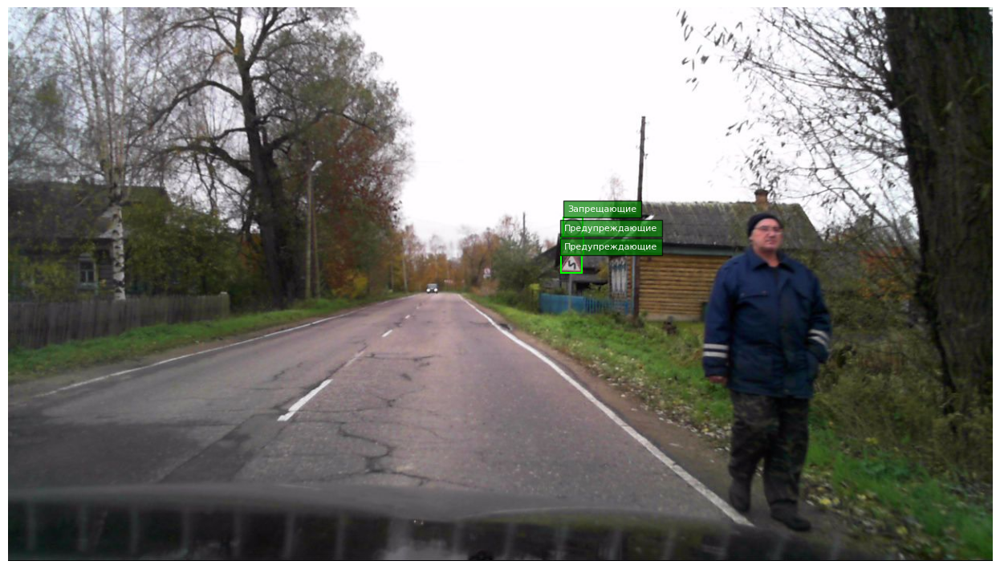

Сохранено: For_presentation\autosave09_10_2012_11_20_09_0_Особые_предписания.jpg


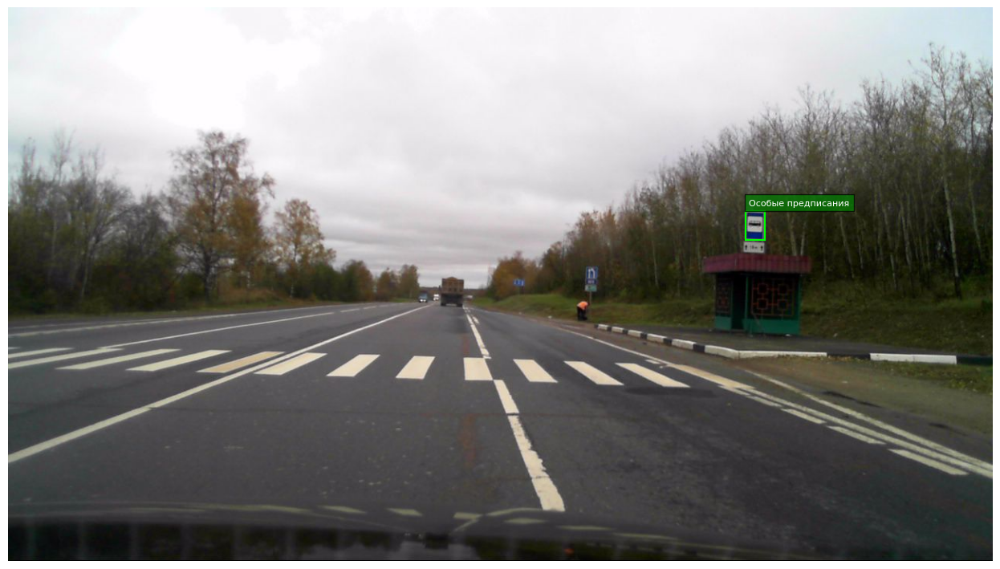

Сохранено: For_presentation\autosave23_10_2012_10_01_00_0_Предписывающие_Особые_предписания.jpg


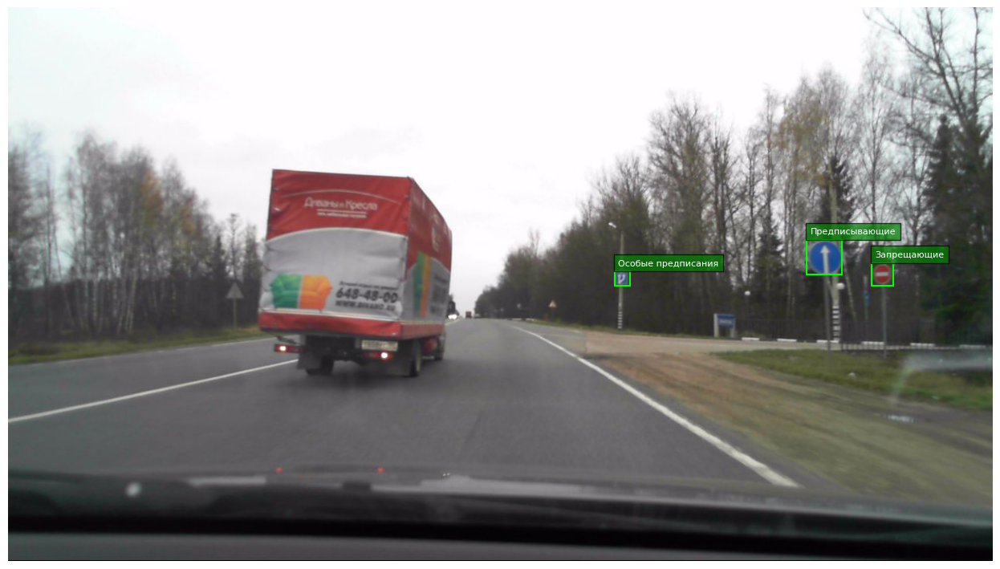

Сохранено: For_presentation\autosave16_04_2013_13_19_29_2_Знаки_приоритета.jpg


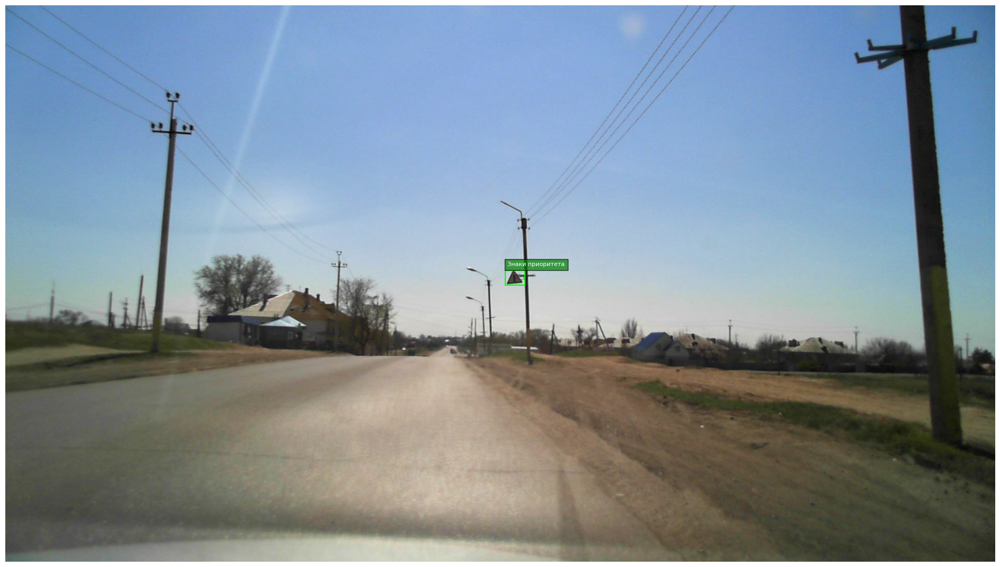

Сохранено: For_presentation\autosave10_10_2012_14_48_35_0_Особые_предписания_Знаки_приоритета.jpg


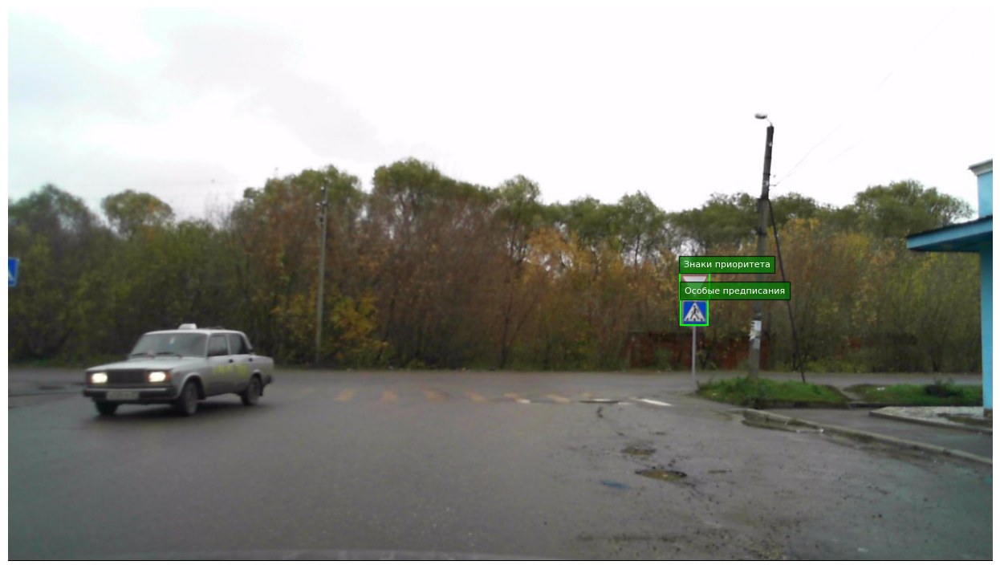

In [14]:
random.seed(18)
sample_images_2 = random.sample(train_anno["images"], 5)

plot_images_with_annotations(
    images_list=sample_images_2,
    annotations=train_anno["annotations"],
    use_category_name=True,
    save=True,
    output_dir=OUTPUT_DIR
)

In [15]:
# Загрузка аннотаций
with open("archive/train_anno_with_categories.json", "r") as f:
    train_anno_2 = json.load(f)

# Создаем DataFrame из аннотаций
df_train = pd.DataFrame(train_anno_2["annotations"])

# Группируем по категориям и считаем количество
category_counts_train = df_train["category_name"].value_counts().reset_index()
category_counts_train.columns = ["Category", "Count"]

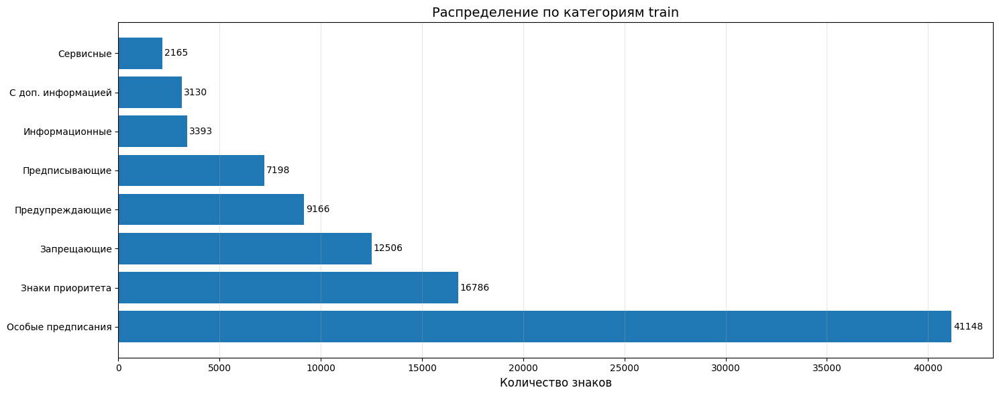

In [16]:
plt.figure(figsize=(15, 6))
bars = plt.barh(
    category_counts_train["Category"],
    category_counts_train["Count"]
)

# Добавляем подписи
for bar in bars:
    width = bar.get_width()
    plt.text(
        width + 100,
        bar.get_y() + bar.get_height()/2,
        f"{width}",
        va="center",
        fontsize=10
    )

plt.title("Распределение по категориям train", fontsize=14)
plt.xlabel("Количество знаков", fontsize=12)
plt.ylabel("")
plt.grid(axis="x", alpha=0.3)
plt.tight_layout()
plt.show()

**Видим очень большой дисбаланс классов. В дальнейшем будем решать данную проблему.**

In [17]:
# Добавляем категории к аннотациям val
for ann in val_anno["annotations"]:
    class_id = ann["category_id"]
    category = get_category(class_id)
    ann["category_name"] = category  # Добавляем поле с категорией

In [18]:
# Сохраняем обновленные аннотации
with open("archive/val_anno_with_categories.json", "w") as f:
    json.dump(val_anno, f, indent=2)

In [19]:
# Загрузка аннотаций
with open("archive/val_anno_with_categories.json", "r") as f:
    val_anno_2 = json.load(f)

# Создаем DataFrame из аннотаций
df_val = pd.DataFrame(val_anno_2["annotations"])

# Группируем по категориям и считаем количество
category_counts_val = df_val["category_name"].value_counts().reset_index()
category_counts_val.columns = ["Category", "Count"]

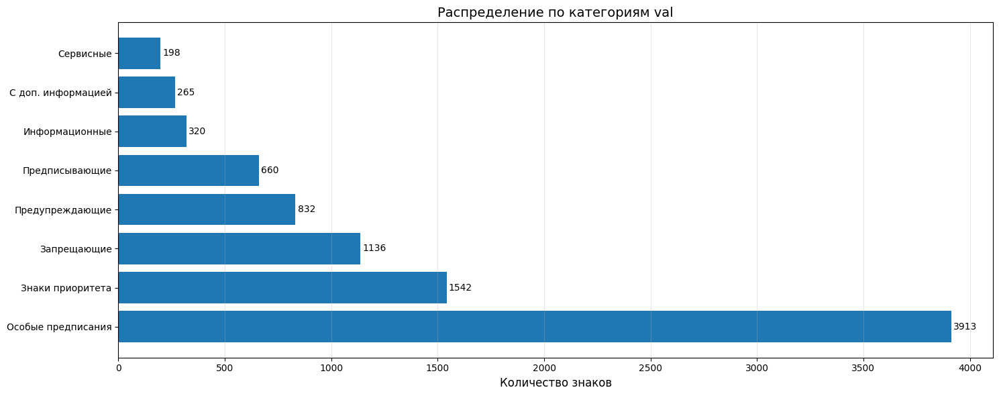

In [20]:
plt.figure(figsize=(15, 6))
bars = plt.barh(
    category_counts_val["Category"],
    category_counts_val["Count"]
)

# Добавляем подписи
for bar in bars:
    width = bar.get_width()
    plt.text(
        width + 10,
        bar.get_y() + bar.get_height()/2,
        f"{width}",
        va="center",
        fontsize=10
    )

plt.title("Распределение по категориям val", fontsize=14)
plt.xlabel("Количество знаков", fontsize=12)
plt.ylabel("")
plt.grid(axis="x", alpha=0.3)
plt.tight_layout()
plt.show()

**На валидационных данных дисбаланс также сохраняется**